
# Hurricane Damage Detection: Exploratory Data Analysis

Figures save to `/plots` as PDFs.


In [3]:
# Import standard libraries
from pathlib import Path
import hashlib
import math
import random
import warnings
from typing import Dict
from typing import List
from tqdm import tqdm
from itertools import product

# Import third-party libraries
import numpy as np
import pandas as pd
from PIL import Image, ImageOps, ImageEnhance
import matplotlib.pyplot as plt
import seaborn as sns

# Import geospatial libraries
try:
    import geopandas as gpd
    from shapely.geometry import box
    import matplotlib.patheffects as pe
except ImportError:
    gpd = None
    box = None
    pe = None


# Set global plotting style
sns.set_theme(style='whitegrid', palette='colorblind')
plt.rcParams.update({'figure.dpi': 300, 'savefig.dpi': 300, 'axes.titlesize': 12, 'axes.labelsize': 11, 'legend.fontsize': 10})

# Global constants
DATA_DIR = Path('data_resampled')
PLOTS_DIR = Path('eda_plots')
PLOTS_DIR.mkdir(exist_ok=True)
SEED = 42 # for reproducibility (always answer to everything)
rng = np.random.default_rng(SEED)

# Steering variables for analysis
INCLUDE_SPLITS = ['train', 'validation', 'test']  # include all to capture domain shift between the splits
STAT_SAMPLE_SIZE = None        # pixel stats (None = all)
SIZE_SAMPLE_SIZE = None        # size stats (None = all)
SPLIT_STAT_SAMPLE_SIZE = None  # per-split pixel stats (None = all)
DUPLICATE_SAMPLE = None        # duplicate hashing (None = all)
QUALITY_SAMPLE_SIZE = None     # corruption check (None = all)
PHOTO_SAMPLE_SIZE = None       # brightness/contrast stats (None = all)
GRID_SAMPLES = 9               # images per grid

label_palette = {'damage': '#de8f05', 'no_damage': '#0173b2'}

def save_fig(fig, name: str):
    path = PLOTS_DIR / f"eda_resampled_dataset_{name}.pdf"
    fig.savefig(path, bbox_inches='tight', format='pdf')
    print(f'Saved figure to {path}')
    return path


## Sampling controls
- `INCLUDE_SPLITS`: splits to load (default all).
- `STAT_SAMPLE_SIZE`: images for pixel stats.
- `SIZE_SAMPLE_SIZE`: images for size stats.
- `SPLIT_STAT_SAMPLE_SIZE`: per-split pixel stats.
- `DUPLICATE_SAMPLE`: images to hash for duplicates.
- `QUALITY_SAMPLE_SIZE`: images to verify for corruption.
- `PHOTO_SAMPLE_SIZE`: images for brightness/contrast.
- `GRID_SAMPLES`: images per grid panel.

They're important and needs be considered.


## 1) Discover dataset layout

In [69]:
def load_image_dataframe(data_dir: Path, splits: List[str]) -> pd.DataFrame:
    rows = []
    for split in splits:
        split_dir = data_dir / split
        if not split_dir.exists():
            continue
        for label_dir in split_dir.iterdir():
            if not label_dir.is_dir():
                continue
            label = label_dir.name
            for path in label_dir.glob('*.jpeg'):
                stem = path.stem
                rows.append({'split': split, 'label': label, 'path': path, 'filename': path.name, 'stem': stem})
    df = pd.DataFrame(rows)
    return df.sort_values(['split', 'label']).reset_index(drop=True)

image_df = load_image_dataframe(DATA_DIR, INCLUDE_SPLITS)
print(f"Loaded {len(image_df):,} images from splits {INCLUDE_SPLITS}")
image_df.head()


Loaded 23,000 images from splits ['train', 'validation', 'test']


,split,label,path,filename,stem
0,test,damage,../data_resampled/test/damage/-95.547258_29.75...,-95.547258_29.759346__dup1.jpeg,-95.547258_29.759346__dup1
1,test,damage,../data_resampled/test/damage/-93.980652_29.90...,-93.980652_29.900920000000003.jpeg,-93.980652_29.900920000000003
2,test,damage,../data_resampled/test/damage/-95.594681999999...,-95.59468199999999_29.76237.jpeg,-95.59468199999999_29.76237
3,test,damage,../data_resampled/test/damage/-95.636994_29.83...,-95.636994_29.838171999999997.jpeg,-95.636994_29.838171999999997
4,test,damage,../data_resampled/test/damage/-95.554432999999...,-95.55443299999999_29.763201000000002.jpeg,-95.55443299999999_29.763201000000002


In [ ]:
counts = (image_df
          .groupby(['split', 'label'])
          .size()
          .unstack(fill_value=0)
          .assign(total=lambda d: d.sum(axis=1)))
counts.loc['all'] = counts.sum()
counts

label,damage,no_damage,total
split,,,
test,1325,675,2000
train,12390,6609,18999
validation,1285,716,2001
all,15000,8000,23000


Saved figure to ../eda_plots/eda_resampled_dataset_class_counts_ratios.pdf


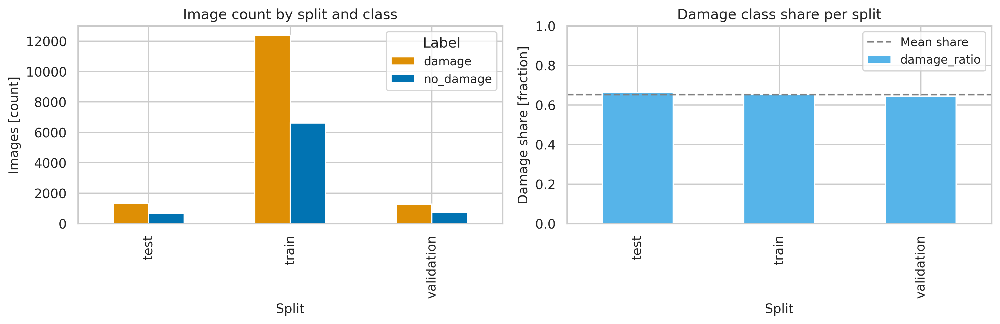

In [71]:

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
counts_no_total = counts.drop(index='all') if 'all' in counts.index else counts
counts_no_total[['damage', 'no_damage']].plot(kind='bar', ax=axes[0], stacked=False, color=[label_palette['damage'], label_palette['no_damage']])
axes[0].set_title('Image count by split and class')
axes[0].set_ylabel('Images [count]')
axes[0].set_xlabel('Split')
axes[0].legend(title='Label')

ratios = (counts_no_total['damage'] / (counts_no_total['damage'] + counts_no_total['no_damage'])).rename('damage_ratio')
ratios.plot(kind='bar', ax=axes[1], color='#56b4e9')
axes[1].set_ylim(0, 1)
axes[1].set_title('Damage class share per split')
axes[1].set_ylabel('Damage share [fraction]')
axes[1].set_xlabel('Split')
axes[1].axhline(ratios.mean(), color='gray', linestyle='--', label='Mean share')
axes[1].legend()
plt.tight_layout()
save_fig(fig, 'class_counts_ratios')
plt.show()


## 2) Geographic coverage

Saved figure to ../eda_plots/eda_resampled_dataset_lon_lat_scatter.pdf


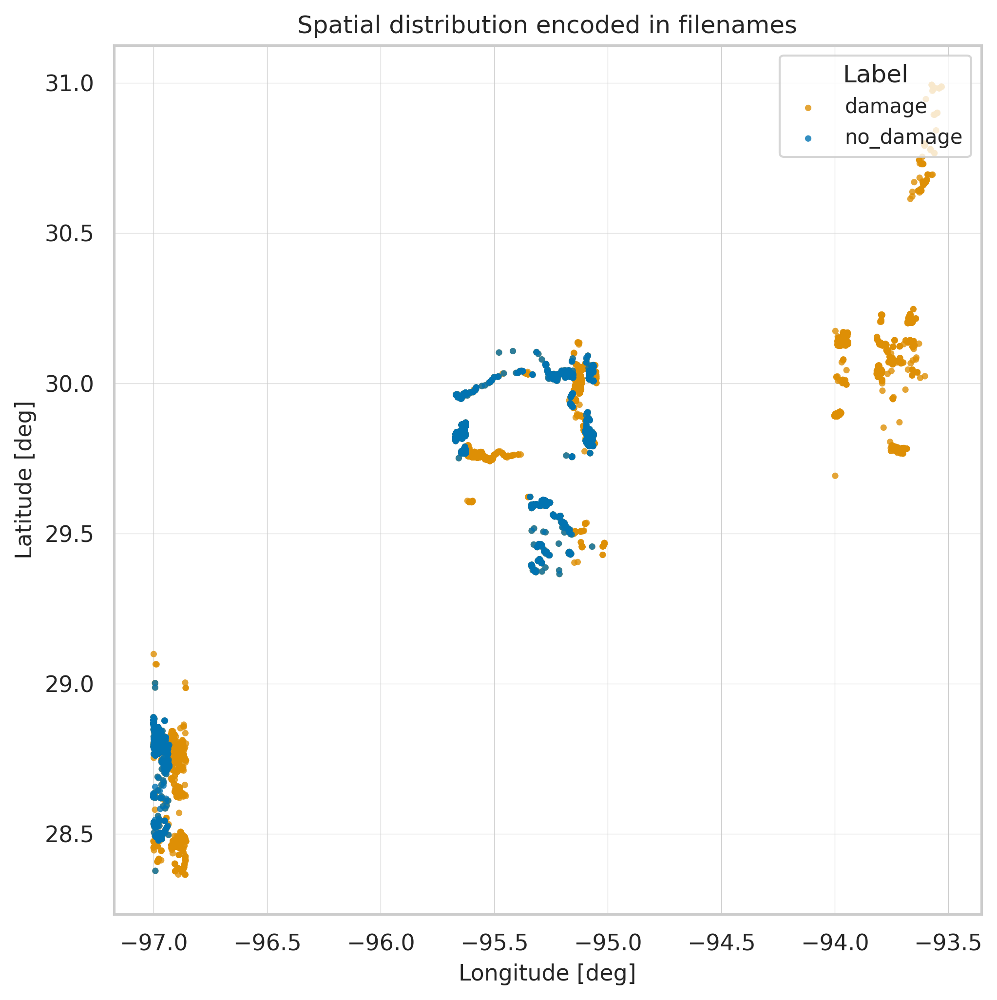

In [ ]:
def extract_coords(stem: str):
    try:
        lon_str, lat_str = stem.split('_')
        return float(lon_str), float(lat_str)
    except Exception:
        return (np.nan, np.nan)

coords = image_df['stem'].apply(extract_coords)
image_df[['lon', 'lat']] = pd.DataFrame(coords.tolist(), index=image_df.index)
valid_coords = image_df.dropna(subset=['lon', 'lat'])

fig, ax = plt.subplots(figsize=(7, 7))
for label, color in [('damage', label_palette['damage']), ('no_damage', label_palette['no_damage'])]:
    subset = valid_coords[valid_coords['label'] == label]
    ax.scatter(subset['lon'], subset['lat'], s=10, alpha=0.8, label=label, c=color, edgecolors='none')
ax.legend(title='Label', loc='upper right')
ax.set_title('Spatial distribution encoded in filenames')
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
ax.grid(True, linewidth=0.3)
plt.tight_layout()
save_fig(fig, 'lon_lat_scatter')
plt.show()


### 2a) Map view

Saved figure to ../eda_plots/eda_resampled_dataset_map_lon_lat.pdf


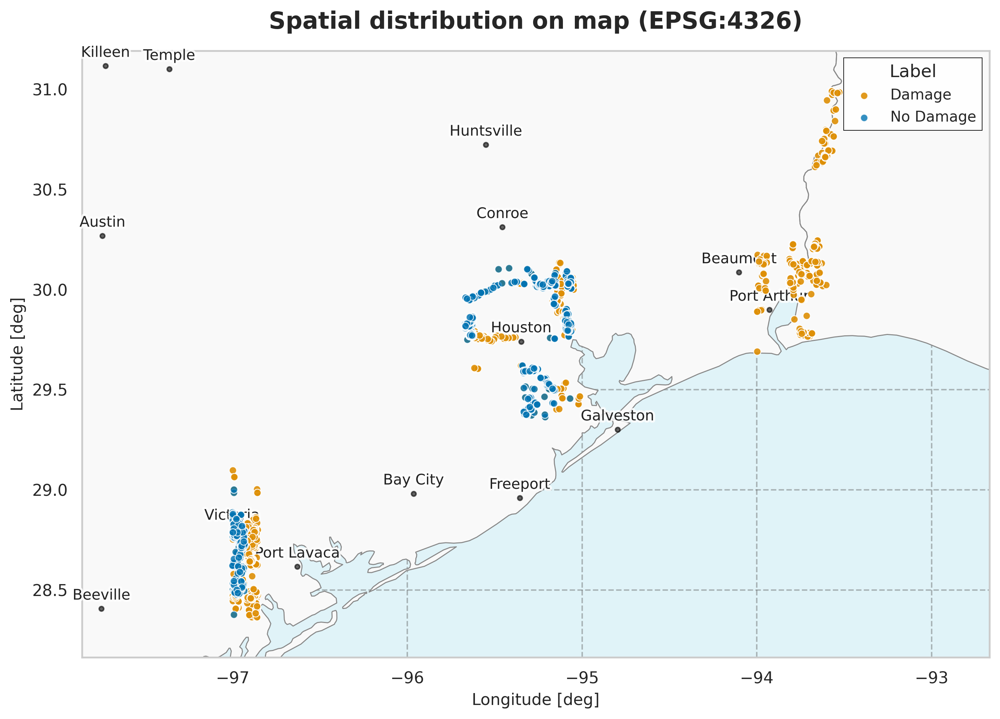

In [73]:

if gpd is not None and box is not None:
    try:
        url_land = "https://naciscdn.org/naturalearth/10m/physical/ne_10m_land.zip"
        url_states = "https://naciscdn.org/naturalearth/10m/cultural/ne_10m_admin_1_states_provinces.zip"
        url_cities = "https://naciscdn.org/naturalearth/10m/cultural/ne_10m_populated_places.zip"

        land = gpd.read_file(url_land)
        states = gpd.read_file(url_states)
        cities = gpd.read_file(url_cities)

        usa_states = states[states['adm0_a3'] == 'USA']
        major_cities = cities[cities['SCALERANK'] < 8]

        gdf = gpd.GeoDataFrame(valid_coords[['split', 'label']], geometry=gpd.points_from_xy(valid_coords['lon'], valid_coords['lat']), crs='EPSG:4326')

        minx, miny, maxx, maxy = gdf.total_bounds
        fig_w, fig_h = 12, 7
        aspect_ratio = fig_w / fig_h
        pad_y = 0.2
        height_span = (maxy - miny) + (pad_y * 2)
        width_span = height_span * aspect_ratio
        ymid = (miny + maxy) / 2
        xmid = (minx + maxx) / 2
        xlims = (xmid - width_span / 2, xmid + width_span / 2)
        ylims = (ymid - height_span / 2, ymid + height_span / 2)
        view_box = box(xlims[0], ylims[0], xlims[1], ylims[1])

        fig, ax = plt.subplots(figsize=(fig_w, fig_h))
        ax.set_facecolor('#e0f3f8')

        land_clip = gpd.clip(land, view_box)
        land_clip.plot(ax=ax, color='#f9f9f9', edgecolor='#b0b0b0', linewidth=0.3)

        states_clip = gpd.clip(usa_states, view_box)
        states_clip.boundary.plot(ax=ax, color='#888888', linewidth=0.7, linestyle='-')

        cities_clip = gpd.clip(major_cities, view_box)
        cities_clip.plot(ax=ax, color='black', markersize=10, alpha=0.6, zorder=3)
        for x, y, label in zip(cities_clip.geometry.x, cities_clip.geometry.y, cities_clip['NAME']):
            txt = ax.text(x, y + 0.03, label, fontsize=10, ha='center', va='bottom', color='#222222', zorder=4)
            if pe:
                txt.set_path_effects([pe.withStroke(linewidth=3, foreground='white', alpha=0.8)])

        gdf[gdf['label'] == 'damage'].plot(ax=ax, markersize=25, color=label_palette['damage'], alpha=0.9, label='Damage', edgecolor='white', linewidth=0.6, zorder=5)
        gdf[gdf['label'] == 'no_damage'].plot(ax=ax, markersize=25, color=label_palette['no_damage'], alpha=0.8, label='No Damage', edgecolor='white', linewidth=0.6, zorder=5)

        handles, labels = ax.get_legend_handles_labels()
        seen = set(); uniq_h = []; uniq_l = []
        for h, l in zip(handles, labels):
            if l not in seen:
                uniq_h.append(h); uniq_l.append(l); seen.add(l)

        ax.set_xlim(xlims)
        ax.set_ylim(ylims)
        ax.grid(True, linestyle='--', alpha=0.4, color='#555555')
        ax.set_title('Spatial distribution on map (EPSG:4326)', fontsize=16, pad=15, weight='bold')
        ax.set_xlabel('Longitude [deg]')
        ax.set_ylabel('Latitude [deg]')
        leg = ax.legend(uniq_h, uniq_l, loc='upper right', frameon=True, framealpha=0.9, fancybox=False, edgecolor='black', title='Label')
        leg.get_frame().set_linewidth(0.5)
        plt.tight_layout()
        save_fig(fig, 'map_lon_lat')
        plt.show()
    except Exception as e:
        print(f'Error rendering map: {e}')
else:
    print('Geopandas/shapely not available; map skipped.')


### 2b) Co-located images

In [74]:
coord_counts = (valid_coords.groupby(['lon', 'lat'])
                .agg(count=('label', 'size'), labels=('label', lambda x: set(x)), splits=('split', lambda x: set(x)),
                     paths=('path', lambda x: list(x)))
                .reset_index())

dup_coords = coord_counts[coord_counts['count'] > 1]
conflict_coords = coord_counts[coord_counts['labels'].apply(lambda s: len(s) > 1)]

summary = pd.DataFrame({
    'total_coords': [len(coord_counts)],
    'coords_with_multiple_images': [len(dup_coords)],
    'coords_with_both_labels': [len(conflict_coords)],
    'max_images_per_coord': [coord_counts['count'].max()]
})
display(summary)
print('Examples of conflicting-label coordinates:')
display(conflict_coords.head())


,total_coords,coords_with_multiple_images,coords_with_both_labels,max_images_per_coord
0,14223,6834,6834,2


Examples of conflicting-label coordinates:


,lon,lat,count,labels,splits,paths
2,-97.001677,28.864984,2,"{no_damage, damage}",{train},[../data_resampled/train/damage/-97.001677_28....
3,-97.001440,28.622429,2,"{no_damage, damage}",{train},[../data_resampled/train/damage/-97.00144_28.6...
5,-97.001414,28.622662,2,"{no_damage, damage}",{train},[../data_resampled/train/damage/-97.001414_28....
6,-97.001414,28.868231,2,"{no_damage, damage}",{train},[../data_resampled/train/damage/-97.001414_28....
8,-97.001302,28.622450,2,"{no_damage, damage}",{test},[../data_resampled/test/damage/-97.001302_28.6...


Saved figure to ../eda_plots/eda_resampled_dataset_coords_conflicts.pdf


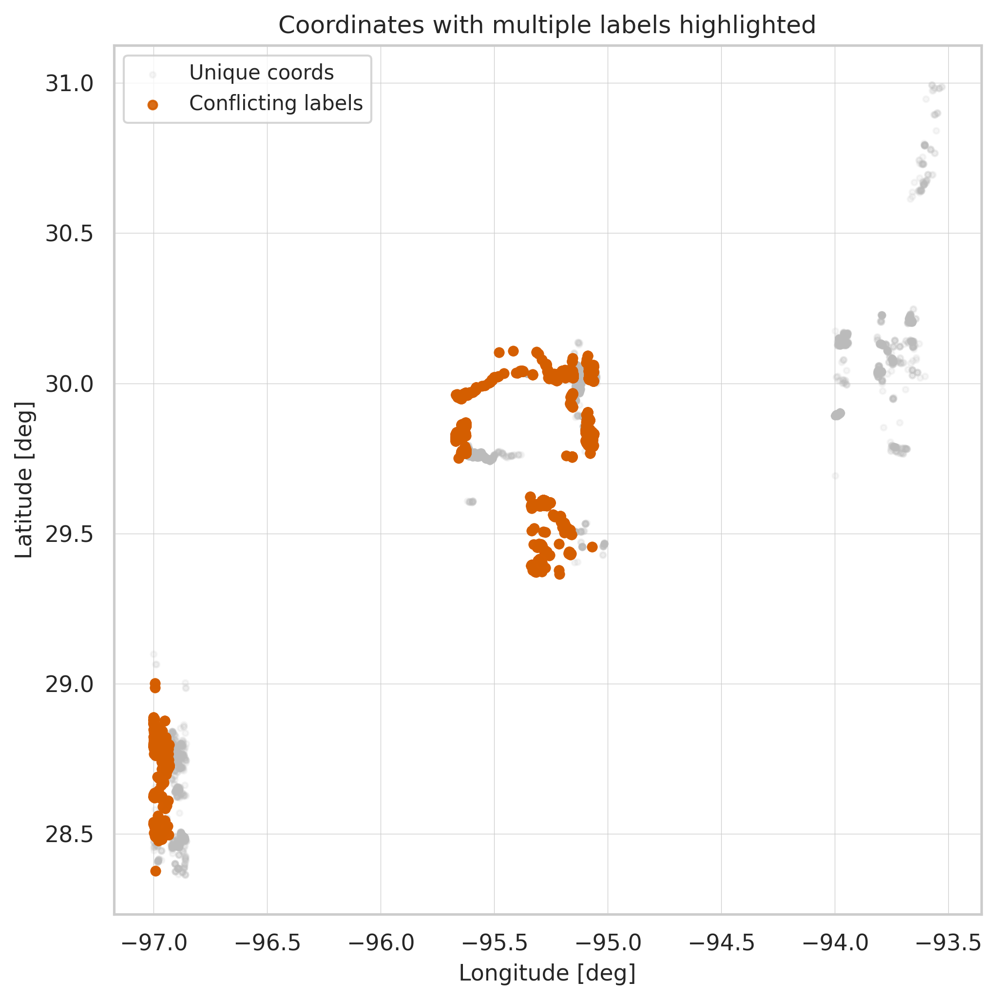

In [75]:

fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(valid_coords['lon'], valid_coords['lat'], s=8, alpha=0.12, color='#bbbbbb', label='Unique coords')
conflict_mask = valid_coords[['lon', 'lat']].apply(tuple, axis=1).isin(set(zip(conflict_coords['lon'], conflict_coords['lat'])))
conflict_points = valid_coords[conflict_mask]
ax.scatter(conflict_points['lon'], conflict_points['lat'], s=18, alpha=0.9, color='#d55e00', label='Conflicting labels')
ax.set_title('Coordinates with multiple labels highlighted')
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
ax.legend()
ax.grid(True, linewidth=0.3)
plt.tight_layout()
save_fig(fig, 'coords_conflicts')
plt.show()


Saved figure to ../eda_plots/eda_resampled_dataset_same_coord_2231.pdf


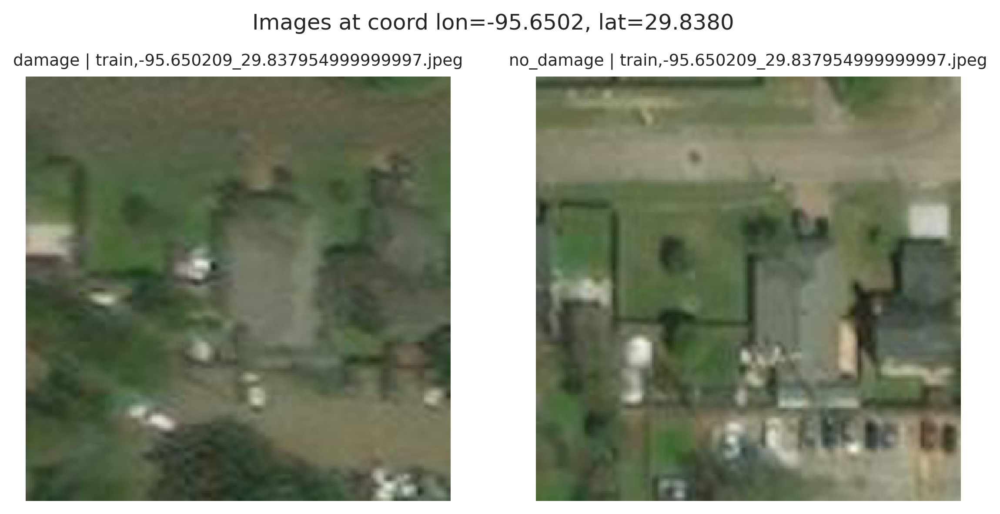

Saved figure to ../eda_plots/eda_resampled_dataset_same_coord_10466.pdf


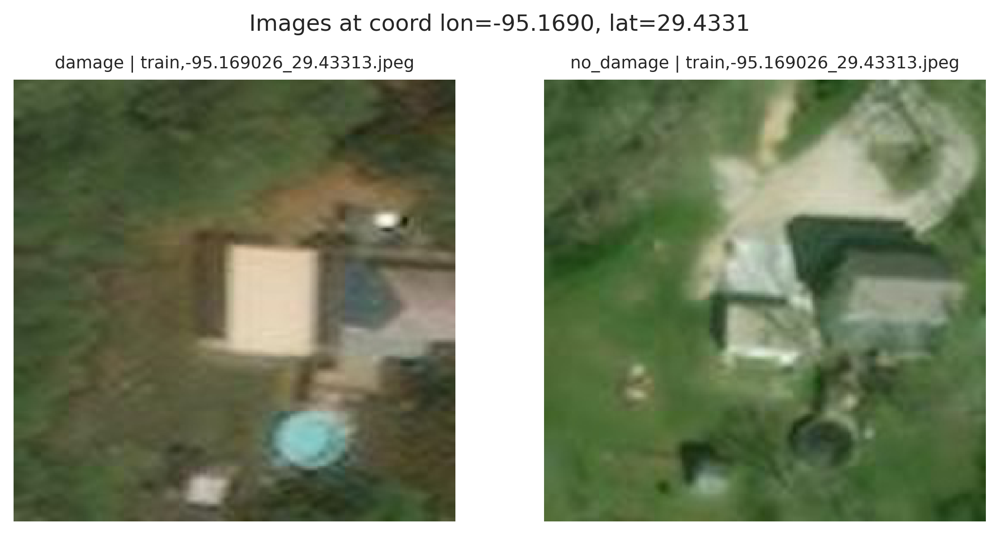

Saved figure to ../eda_plots/eda_resampled_dataset_same_coord_539.pdf


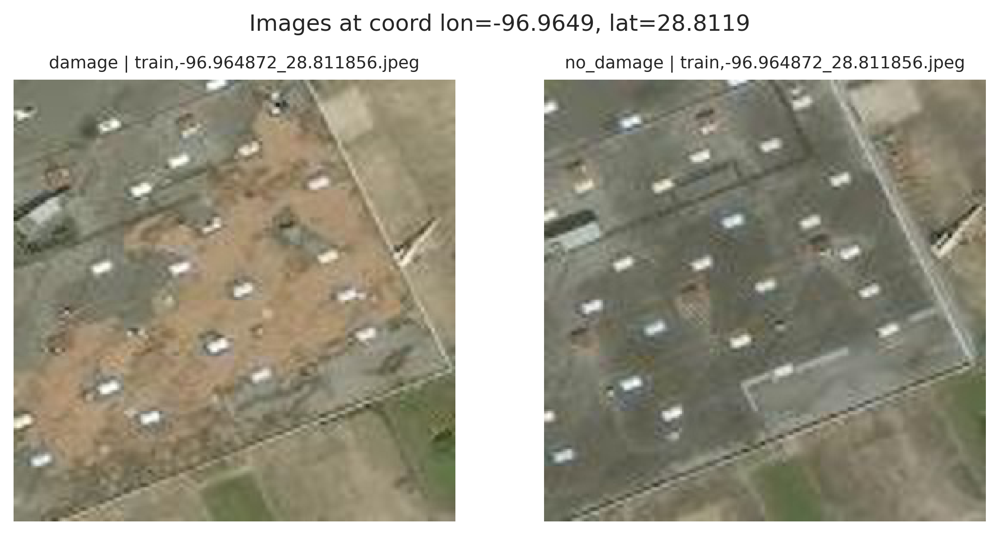

Saved figure to ../eda_plots/eda_resampled_dataset_same_coord_10436.pdf


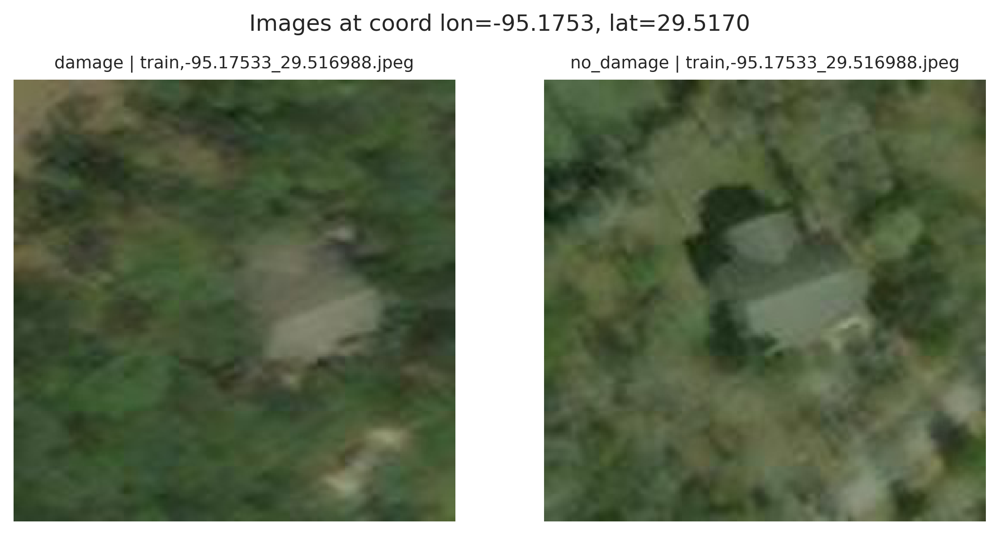

Saved figure to ../eda_plots/eda_resampled_dataset_same_coord_3610.pdf


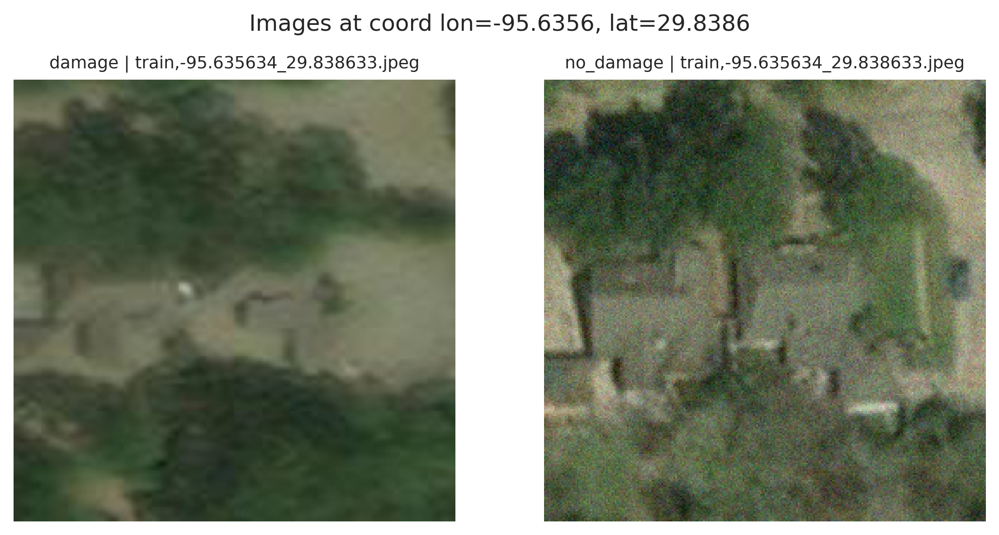

In [76]:
SAME_COORD_SAMPLE = 5
IMAGES_PER_COORD = 6

sample_coords = dup_coords.sample(min(SAME_COORD_SAMPLE, len(dup_coords)), random_state=SEED)

for idx, row in sample_coords.iterrows():
    paths = row['paths'][:IMAGES_PER_COORD]
    coord = (row['lon'], row['lat'])
    cols = min(3, len(paths))
    rows = math.ceil(len(paths) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.array(axes).reshape(-1)
    for ax, path in zip(axes, paths):
        with Image.open(path) as img:
            ax.imshow(img)
        info = valid_coords[valid_coords['path'] == path].iloc[0]
        ax.set_title(f"{info['label']} | {info['split']},{Path(path).name}", fontsize=9)
        ax.axis('off')
    for ax in axes[len(paths):]:
        ax.axis('off')
    fig.suptitle(f'Images at coord lon={coord[0]:.4f}, lat={coord[1]:.4f}', fontsize=12)
    plt.tight_layout()
    save_fig(fig, f'same_coord_{idx}')
    plt.show()


In [77]:
import hashlib
from pathlib import Path
import pandas as pd

def file_md5(path: Path, chunk_size: int = 1 << 16) -> str:
    h = hashlib.md5()
    with open(path, "rb") as f:
        for chunk in iter(lambda: f.read(chunk_size), b""):
            h.update(chunk)
    return h.hexdigest()

records = []
for split in INCLUDE_SPLITS:
    split_dir = DATA_DIR / split
    for img_path in split_dir.rglob("*.jpg"):
        records.append({"split": split, "path": str(img_path), "filename": img_path.name, "hash": file_md5(img_path)})
    for img_path in split_dir.rglob("*.jpeg"):
        records.append({"split": split, "path": str(img_path), "filename": img_path.name, "hash": file_md5(img_path)})
    for img_path in split_dir.rglob("*.png"):
        records.append({"split": split, "path": str(img_path), "filename": img_path.name, "hash": file_md5(img_path)})

df = pd.DataFrame(records)
if df.empty:
    print("No images found under", DATA_DIR.resolve())
else:
    overlap = df.groupby("hash").filter(lambda g: g["split"].nunique() > 1)

    print(f"Total images scanned: {len(df)}")
    print(f"Unique images (by hash): {df['hash'].nunique()}")
    print(f"Potential leakage (same image across splits): {overlap['hash'].nunique()} hashes\n")

    if not overlap.empty:
        combo_counts = overlap.groupby("hash")["split"].apply(lambda s: ", ".join(sorted(s.unique()))).value_counts()
        print("Overlap split combinations:\n", combo_counts, "\n")

        sample_conflicts = overlap.groupby("hash").head(5)
        display(sample_conflicts.head(15))

        first_hash = overlap["hash"].iloc[0]
        print("\nSample conflicting hash:", first_hash)
        display(overlap[overlap["hash"] == first_hash])
    else:
        print("No cross-split duplicates detected.")

Total images scanned: 23000
Unique images (by hash): 22993
Potential leakage (same image across splits): 3 hashes

Overlap split combinations:
 split
train, validation    2
test, train          1
Name: count, dtype: int64 



,split,path,filename,hash
8057,train,../data_resampled/train/damage/-93.79257_30.22...,-93.79257_30.226646000000002.jpeg,0269236c630b26698497381963660cbc
11495,train,../data_resampled/train/damage/-93.792375_30.2...,-93.792375_30.226599.jpeg,3c4b370c87bac346c416aea54cd5b023
13239,train,../data_resampled/train/no_damage/-95.095907_2...,-95.095907_29.845136.jpeg,74c199ab13a33beb597d292f21b9ef06
19782,validation,../data_resampled/validation/damage/-93.792569...,-93.792569_30.226645.jpeg,0269236c630b26698497381963660cbc
19856,validation,../data_resampled/validation/damage/-93.792377...,-93.792377_30.2266.jpeg,3c4b370c87bac346c416aea54cd5b023
22527,test,../data_resampled/test/no_damage/-95.095908_29...,-95.095908_29.845135.jpeg,74c199ab13a33beb597d292f21b9ef06



Sample conflicting hash: 0269236c630b26698497381963660cbc


,split,path,filename,hash
8057,train,../data_resampled/train/damage/-93.79257_30.22...,-93.79257_30.226646000000002.jpeg,0269236c630b26698497381963660cbc
19782,validation,../data_resampled/validation/damage/-93.792569...,-93.792569_30.226645.jpeg,0269236c630b26698497381963660cbc


### 2c) Almost same positions (i.e. close coordinates)

Saved figure to eda_plots/eda_resampled_dataset_almost_same_coordinate_check.pdf


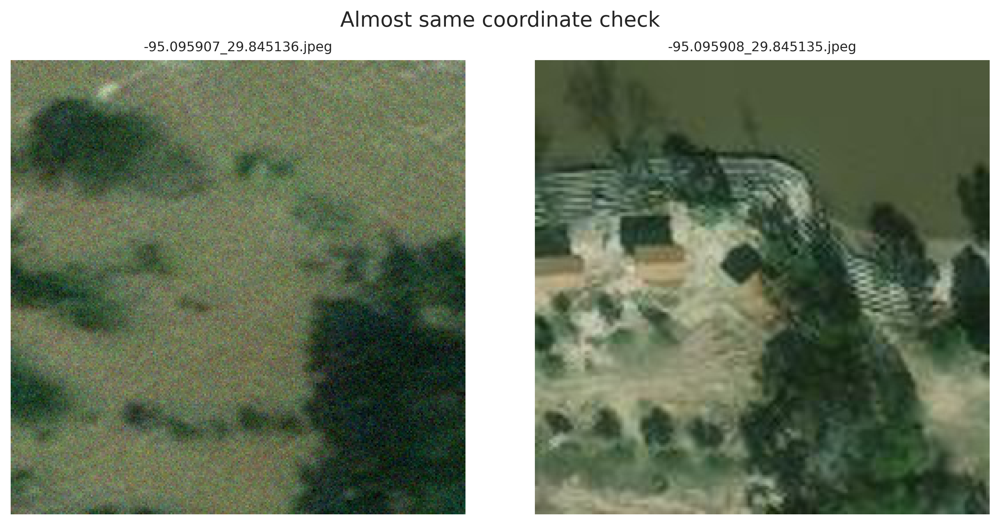

In [6]:
from PIL import Image

import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

img1 = Image.open(f"{DATA_DIR}/train/damage/-95.095907_29.845136.jpeg")
img2 = Image.open(f"{DATA_DIR}/test/no_damage/-95.095908_29.845135.jpeg")

axes[0].imshow(img1)
axes[0].set_title("-95.095907_29.845136.jpeg", fontsize=9)
axes[0].axis('off')

axes[1].imshow(img2)
axes[1].set_title("-95.095908_29.845135.jpeg", fontsize=9)
axes[1].axis('off')

fig.suptitle('Almost same coordinate check', fontsize=14)
plt.tight_layout()
save_fig(fig, 'almost_same_coordinate_check')
plt.show()

### 2c) Split overlap on coordinates

In [78]:

coord_sets = {s: set(zip(df['lon'], df['lat'])) for s, df in valid_coords.groupby('split')}
splits = sorted(coord_sets.keys())
mat = pd.DataFrame(index=splits, columns=splits, dtype=int)
for a in splits:
    for b in splits:
        mat.loc[a, b] = len(coord_sets[a] & coord_sets[b])
mat


,test,train,validation
test,1262.0,0.0,0.0
train,0.0,11752.0,0.0
validation,0.0,0.0,1209.0


### 2d) Spatial density by label

Saved figure to ../eda_plots/eda_resampled_dataset_spatial_distribution_hybrid.pdf


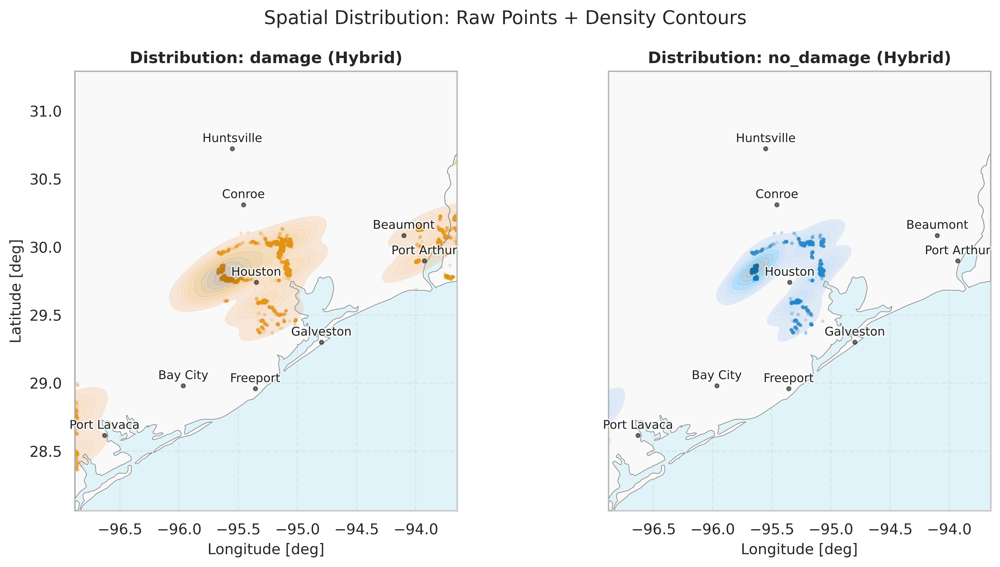

In [79]:
warnings.filterwarnings("ignore", message="Log scale: values of z <= 0")

# (Assuming map layers 'land', 'usa_states', 'major_cities' are already loaded)

# Bounds 
minx, miny, maxx, maxy = gdf.total_bounds
fig_w, fig_h = 12, 6
aspect_ratio = (fig_w / 2) / fig_h 
pad_y = 0.3 
height_span = (maxy - miny) + (pad_y * 2)
width_span = height_span * aspect_ratio
ymid, xmid = (miny + maxy) / 2, (minx + maxx) / 2
xlims = (xmid - width_span / 2, xmid + width_span / 2)
ylims = (ymid - height_span / 2, ymid + height_span / 2)
view_box = box(xlims[0], ylims[0], xlims[1], ylims[1])

# Clip layers
land_clip = gpd.clip(land, view_box)
states_clip = gpd.clip(usa_states, view_box)
cities_clip = gpd.clip(major_cities, view_box)

fig, axes = plt.subplots(1, 2, figsize=(fig_w, fig_h), sharex=True, sharey=True)
labels_to_plot = ['damage', 'no_damage']

for ax, label in zip(axes, labels_to_plot):
    ax.set_facecolor('#e0f3f8') # Sea
    land_clip.plot(ax=ax, color='#f9f9f9', edgecolor='none', zorder=1) # Land

    subset = valid_coords[valid_coords['label'] == label]
    color = label_palette[label]

    # Plots every single point faintly. Shows outliers 
    ax.scatter(
        subset['lon'], subset['lat'], 
        c=color, 
        s=3,        # Very small size
        alpha=0.15, # Very transparent
        label=None, # No legend entry
        zorder=2
    )

    # Highlights the hotspots (Houston)
    sns.kdeplot(
        data=subset, x='lon', y='lat',
        fill=True, 
        color=color,
        ax=ax, 
        levels=10, 
        thresh=0.05,  # Only draw KDE where data is actually dense
        alpha=0.3,    # Semi-transparent to see dots underneath
        zorder=3
    )

    # Context Layers
    states_clip.boundary.plot(ax=ax, color='#888888', linewidth=0.5, zorder=4)
    cities_clip.plot(ax=ax, color='black', markersize=8, alpha=0.5, zorder=5)
    
    for x, y, name in zip(cities_clip.geometry.x, cities_clip.geometry.y, cities_clip['NAME']):
        txt = ax.text(x, y + 0.03, name, fontsize=9, ha='center', va='bottom', color='#222222', zorder=6)
        txt.set_path_effects([pe.withStroke(linewidth=2, foreground='white', alpha=0.7)])

    ax.set_title(f'Distribution: {label} (Hybrid)', weight='bold')
    ax.set_xlim(xlims)
    ax.set_ylim(ylims)
    ax.grid(True, linestyle='--', alpha=0.3)

axes[0].set_ylabel('Latitude [deg]')
axes[0].set_xlabel('Longitude [deg]')
axes[1].set_xlabel('Longitude [deg]')

plt.suptitle('Spatial Distribution: Raw Points + Density Contours', fontsize=14, y=0.98)
plt.tight_layout()
save_fig(fig, 'spatial_distribution_hybrid')
plt.show()

## 3) Image size and aspect ratio

In [80]:
def collect_image_sizes(df: pd.DataFrame, sample_size: int = None) -> pd.DataFrame:
    sample = df if sample_size is None else df.sample(min(sample_size, len(df)), random_state=SEED)
    records = []
    for path in tqdm(sample['path'], desc='Reading sizes'):
        with Image.open(path) as img:
            w, h = img.size
            records.append({'path': path, 'width': w, 'height': h, 'area': w * h, 'split': path.parent.parent.name, 'label': path.parent.name})
    return pd.DataFrame(records)

size_df = collect_image_sizes(image_df, sample_size=SIZE_SAMPLE_SIZE)
size_summary = size_df[['width', 'height', 'area']].describe().round(2)
size_summary

Reading sizes: 100%|██████████| 23000/23000 [00:00<00:00, 42691.36it/s]


,width,height,area
count,23000.0,23000.0,23000.0
mean,256.0,256.0,65536.0
std,0.0,0.0,0.0
min,256.0,256.0,65536.0
25%,256.0,256.0,65536.0
50%,256.0,256.0,65536.0
75%,256.0,256.0,65536.0
max,256.0,256.0,65536.0


Saved figure to ../eda_plots/eda_resampled_dataset_size_distributions.pdf


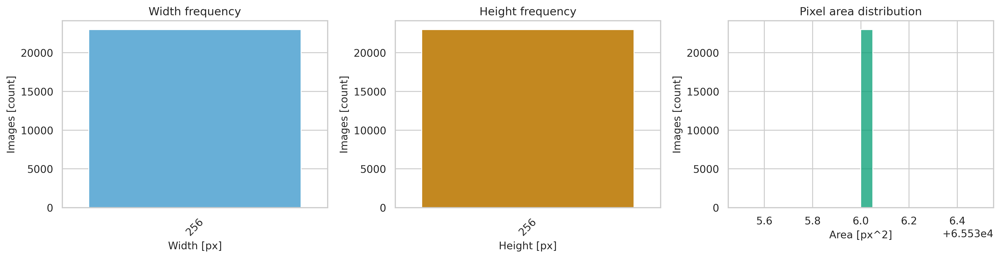

In [81]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
sns.countplot(data=size_df, x='width', ax=axes[0], color='#56b4e9')
axes[0].set_title('Width frequency')
axes[0].set_xlabel('Width [px]')
axes[0].set_ylabel('Images [count]')
axes[0].tick_params(axis='x', rotation=45)

sns.countplot(data=size_df, x='height', ax=axes[1], color='#de8f05')
axes[1].set_title('Height frequency')
axes[1].set_xlabel('Height [px]')
axes[1].set_ylabel('Images [count]')
axes[1].tick_params(axis='x', rotation=45)

sns.histplot(data=size_df, x='area', bins=20, ax=axes[2], color='#029e73')
axes[2].set_title('Pixel area distribution')
axes[2].set_xlabel('Area [px^2]')
axes[2].set_ylabel('Images [count]')
plt.tight_layout()
save_fig(fig, 'size_distributions')
plt.show()

## 4) Pixel intensity statistics

In [82]:
def compute_channel_stats(df: pd.DataFrame, sample_size: int = STAT_SAMPLE_SIZE) -> Dict[str, np.ndarray]:
    sample = df if sample_size is None else df.sample(min(sample_size, len(df)), random_state=SEED)
    totals = np.zeros(3, dtype=np.float64)
    totals_sq = np.zeros(3, dtype=np.float64)
    counts = 0
    hist = np.zeros((3, 256), dtype=np.int64)

    for path in tqdm(sample['path'], desc='Pixel stats'):
        with Image.open(path) as img:
            arr = np.asarray(img.convert('RGB'), dtype=np.uint8)
        pixels = arr.reshape(-1, 3)
        totals += pixels.sum(axis=0)
        totals_sq += (pixels.astype(np.float64) ** 2).sum(axis=0)
        counts += pixels.shape[0]
        for c in range(3):
            hist[c] += np.bincount(pixels[:, c], minlength=256)

    means = totals / counts
    stds = np.sqrt(totals_sq / counts - means ** 2)
    return {'means': means, 'stds': stds, 'hist': hist, 'counts': counts, 'sample_size': len(sample)}

channel_stats = compute_channel_stats(image_df)
print('Sample size used:', channel_stats['sample_size'])
print('Per-channel mean (0-255):', channel_stats['means'])
print('Per-channel std (0-255):', channel_stats['stds'])

Pixel stats: 100%|██████████| 23000/23000 [00:46<00:00, 492.30it/s]

Sample size used: 23000
Per-channel mean (0-255): [89.77479814 97.87541771 72.81165638]
Per-channel std (0-255): [37.05182462 32.15550276 32.59626492]


Saved figure to ../eda_plots/eda_resampled_dataset_channel_histograms.pdf


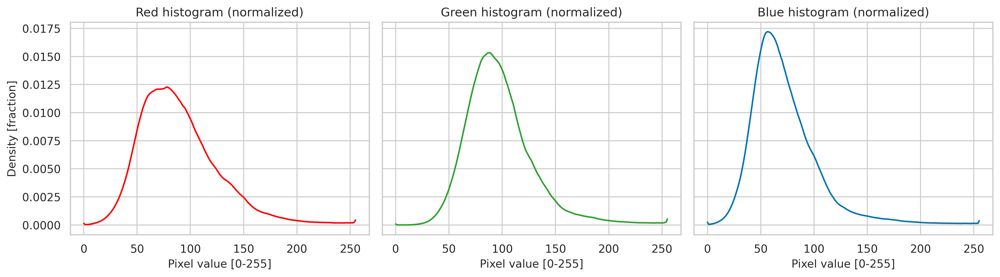

In [83]:
fig, axes = plt.subplots(1, 3, figsize=(14, 4), sharey=True)
colors = ['#ff0000', '#2ca02c', '#0173b2']  # red, green, blue
labels = ['Red', 'Green', 'Blue']
for c, ax, label in zip(range(3), axes, labels):
    hist = channel_stats['hist'][c]
    ax.plot(range(256), hist / hist.sum(), color=colors[c])
    ax.set_title(f'{label} histogram (normalized)')
    ax.set_xlabel('Pixel value [0-255]')
axes[0].set_ylabel('Density [fraction]')
plt.tight_layout()
save_fig(fig, 'channel_histograms')
plt.show()

### 4a) Per-split channel stats

In [84]:
split_stats = {}
for split in ['train', 'validation', 'test']:
    subset = image_df[image_df['split'] == split]
    if subset.empty:
        continue
    split_sample = None if SPLIT_STAT_SAMPLE_SIZE is None else min(SPLIT_STAT_SAMPLE_SIZE, len(subset))
    split_stats[split] = compute_channel_stats(subset, sample_size=split_sample)

if split_stats:
    rows = []
    for split, stats in split_stats.items():
        rows.append({'split': split,
                     'mean_r': stats['means'][0], 'mean_g': stats['means'][1], 'mean_b': stats['means'][2],
                     'std_r': stats['stds'][0], 'std_g': stats['stds'][1], 'std_b': stats['stds'][2]})
    display(pd.DataFrame(rows).set_index('split').round(2))

Pixel stats: 100%|██████████| 2000/2000 [00:03<00:00, 500.06it/s]


,mean_r,mean_g,mean_b,std_r,std_g,std_b
split,,,,,,
train,89.83,97.92,72.84,37.10,32.20,32.66
validation,88.87,97.30,72.20,36.62,31.85,32.14
test,90.12,98.00,73.19,36.99,32.01,32.41


### 4b) Brightness and contrast by split

Saved figure to ../eda_plots/eda_resampled_dataset_brightness_contrast_box.pdf


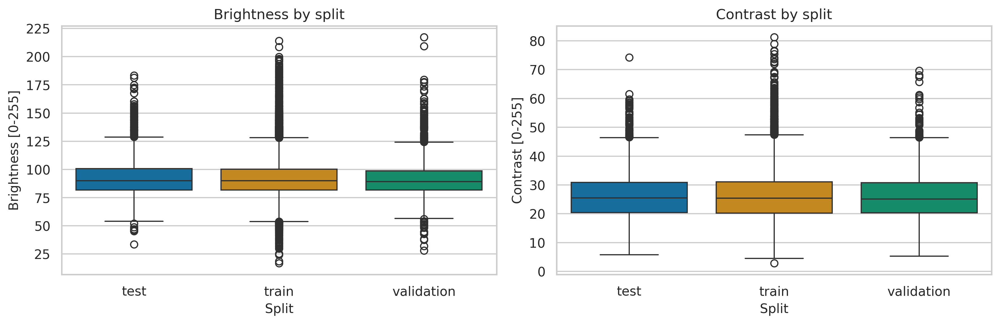

In [85]:
def brightness_contrast(df: pd.DataFrame, sample_size: int = PHOTO_SAMPLE_SIZE):
    sample = df if sample_size is None else df.sample(min(sample_size, len(df)), random_state=SEED)
    records = []
    for _, row in sample.iterrows():
        with Image.open(row['path']) as img:
            gray = np.asarray(img.convert('L'), dtype=np.float32)
        records.append({'split': row['split'], 'label': row['label'], 'brightness': gray.mean(), 'contrast': gray.std()})
    return pd.DataFrame(records)

photo_stats = brightness_contrast(image_df)
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.boxplot(data=photo_stats, x='split', y='brightness', palette='colorblind', ax=axes[0], hue='split')
axes[0].set_title('Brightness by split')
axes[0].set_xlabel('Split')
axes[0].set_ylabel('Brightness [0-255]')

sns.boxplot(data=photo_stats, x='split', y='contrast', palette='colorblind', ax=axes[1], hue='split')
axes[1].set_title('Contrast by split')
axes[1].set_xlabel('Split')
axes[1].set_ylabel('Contrast [0-255]')
plt.tight_layout()
save_fig(fig, 'brightness_contrast_box')
plt.show()

### 4c) Brightness and contrast density

Saved figure to ../eda_plots/eda_resampled_dataset_brightness_contrast_density.pdf


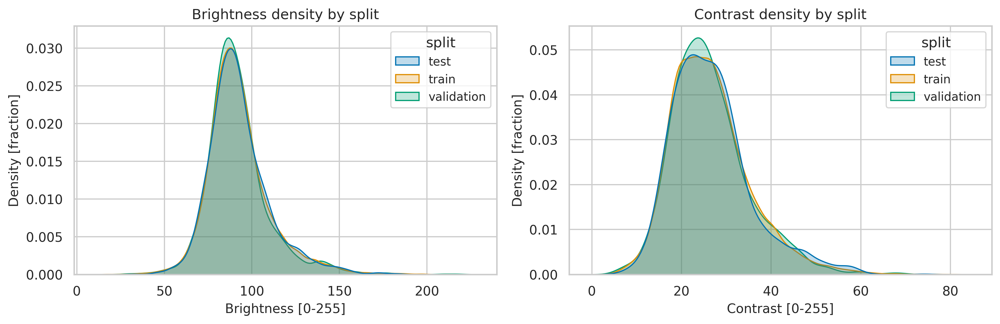

In [86]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.kdeplot(data=photo_stats, x='brightness', hue='split', fill=True, common_norm=False, palette='colorblind', ax=axes[0])
axes[0].set_title('Brightness density by split')
axes[0].set_xlabel('Brightness [0-255]')
axes[0].set_ylabel('Density [fraction]')

sns.kdeplot(data=photo_stats, x='contrast', hue='split', fill=True, common_norm=False, palette='colorblind', ax=axes[1])
axes[1].set_title('Contrast density by split')
axes[1].set_xlabel('Contrast [0-255]')
axes[1].set_ylabel('Density [fraction]')
plt.tight_layout()
save_fig(fig, 'brightness_contrast_density')
plt.show()

## 5) Visual sanity checks

Saved figure to ../eda_plots/eda_resampled_dataset_grid_train_damage.pdf


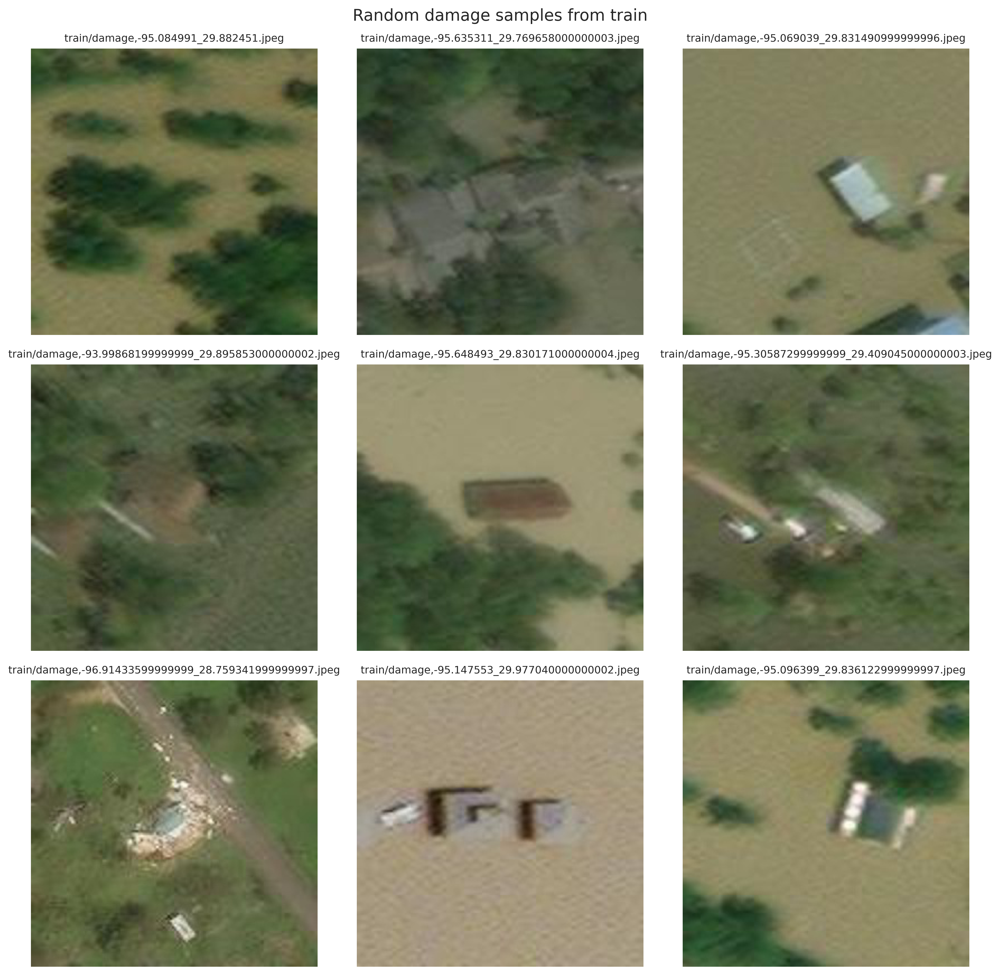

Saved figure to ../eda_plots/eda_resampled_dataset_grid_train_no_damage.pdf


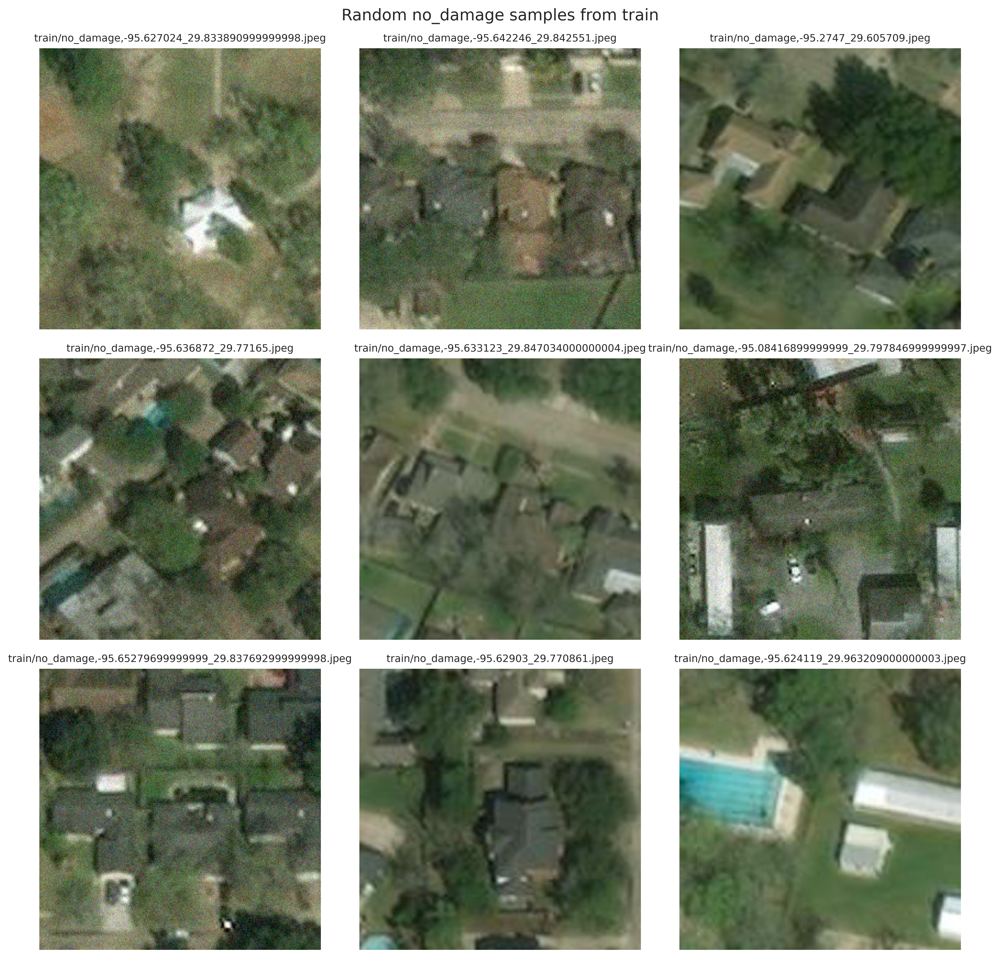

Saved figure to ../eda_plots/eda_resampled_dataset_grid_validation_damage.pdf


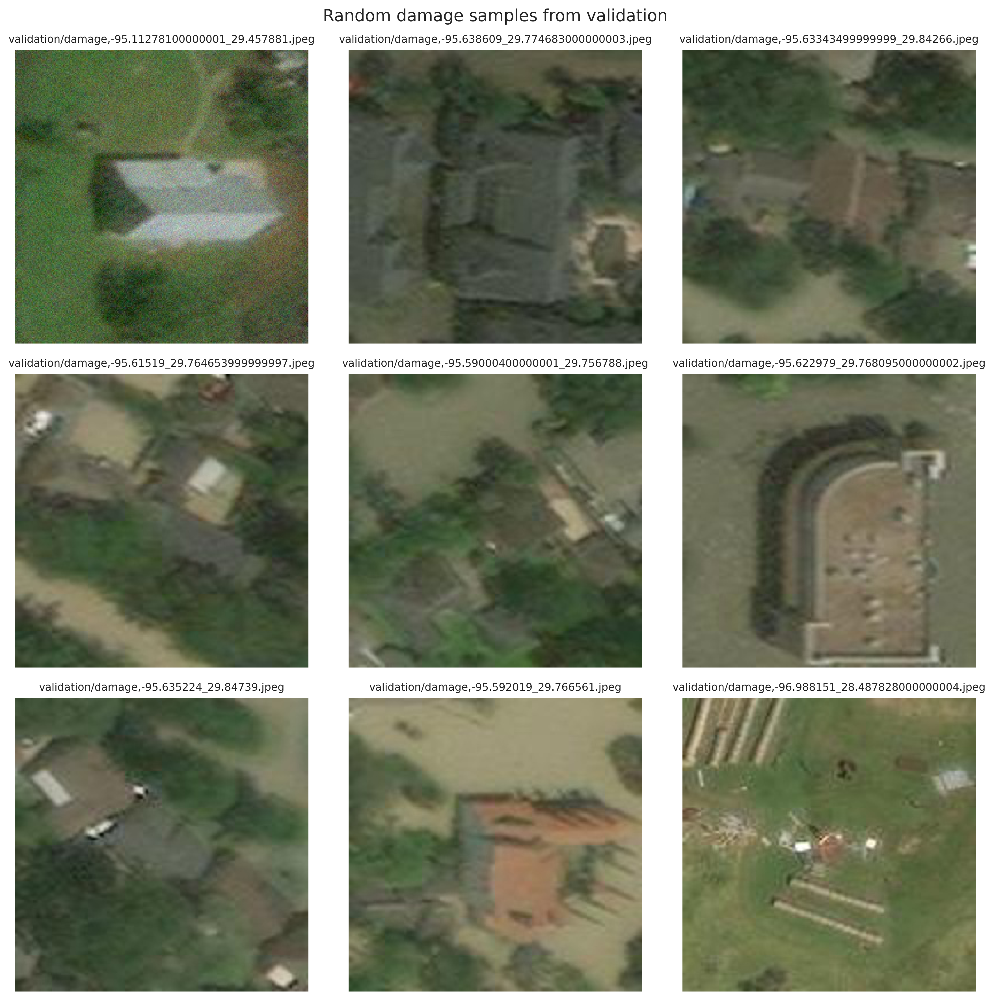

Saved figure to ../eda_plots/eda_resampled_dataset_grid_validation_no_damage.pdf


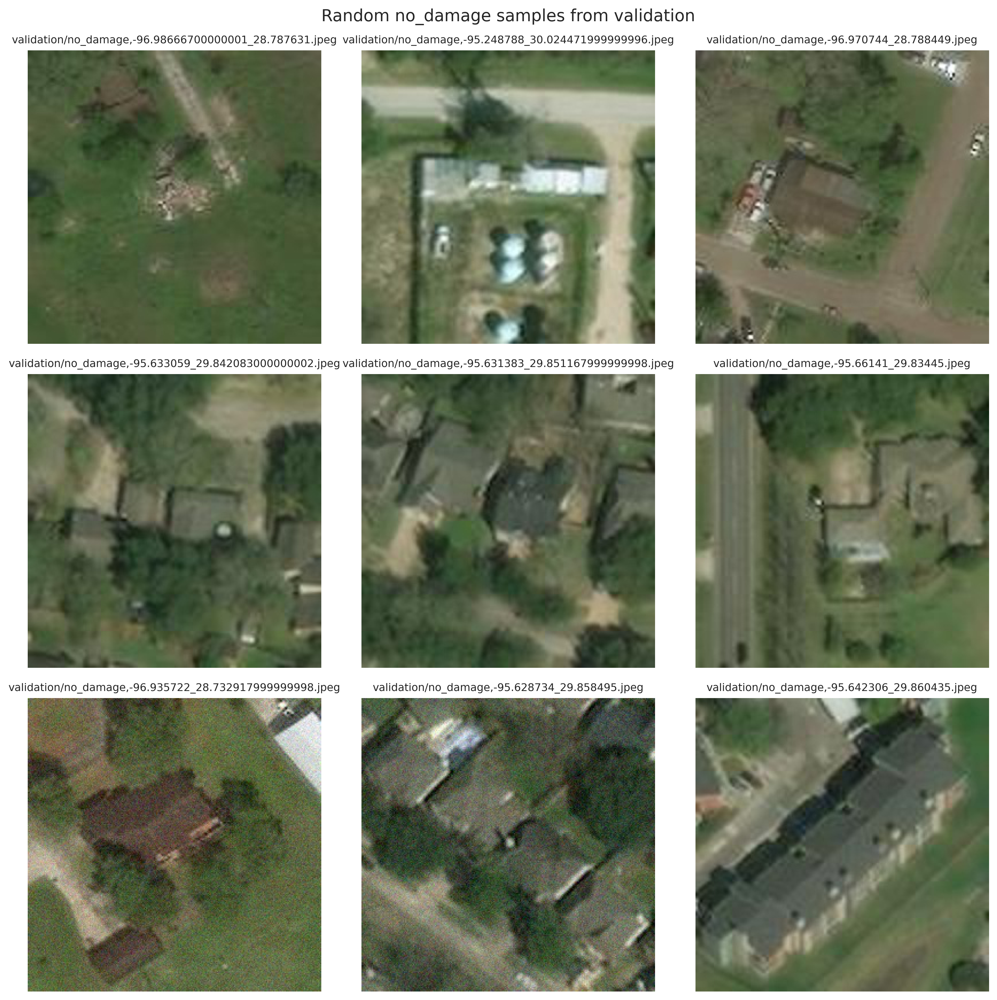

Saved figure to ../eda_plots/eda_resampled_dataset_grid_test_damage.pdf


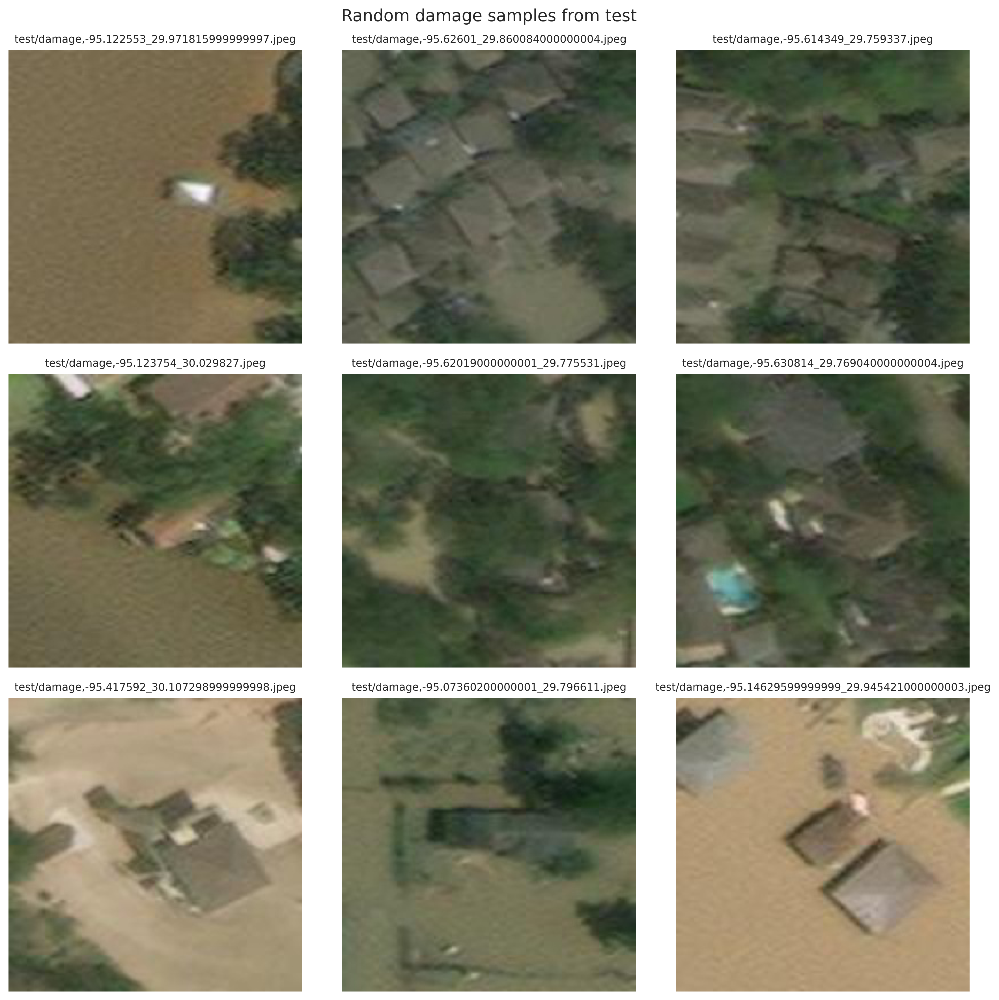

Saved figure to ../eda_plots/eda_resampled_dataset_grid_test_no_damage.pdf


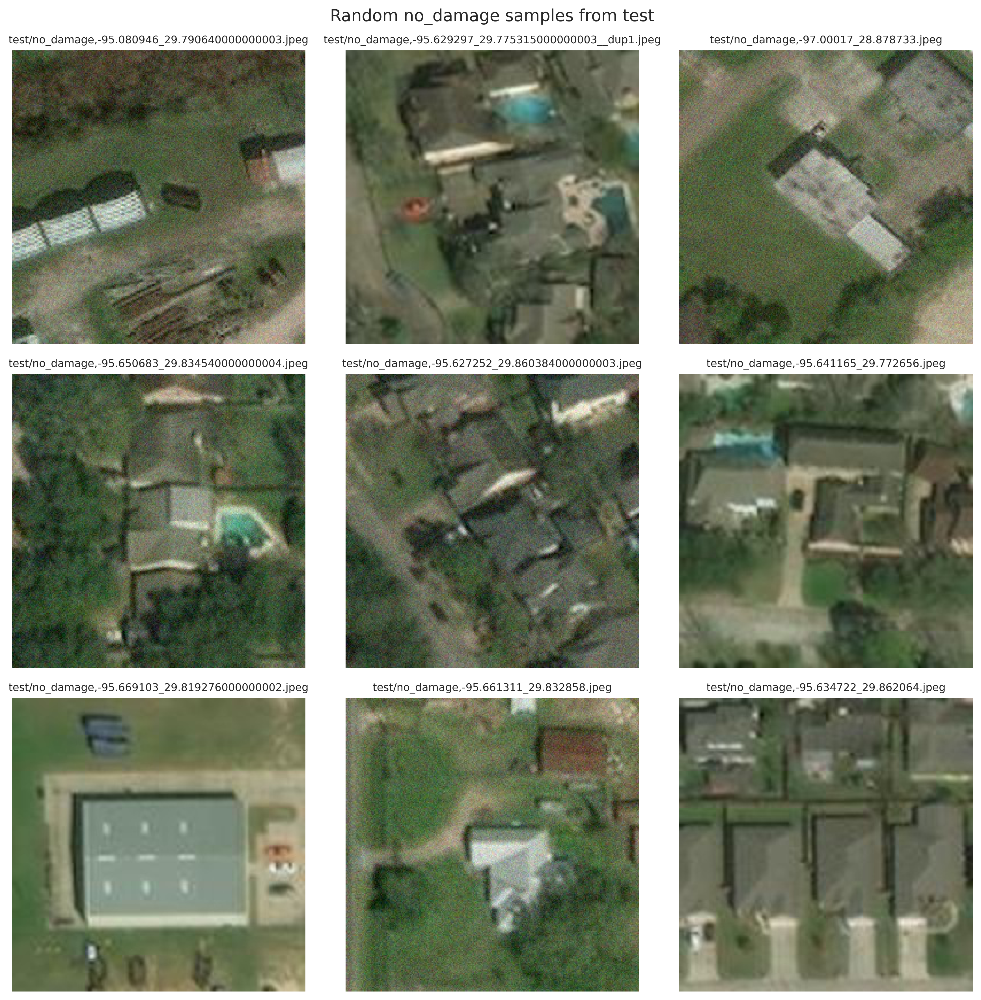

In [87]:
def plot_image_grid(df: pd.DataFrame, split: str, label: str, n: int = GRID_SAMPLES):
    subset = df[(df['split'] == split) & (df['label'] == label)]
    if subset.empty:
        print(f'No images for {split}/{label}')
        return
    sample = subset.sample(min(n, len(subset)), random_state=SEED)
    cols = 3
    rows = math.ceil(len(sample) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = axes.flatten()
    for ax, (_, row) in zip(axes, sample.iterrows()):
        with Image.open(row['path']) as img:
            ax.imshow(img)
        ax.set_title(f"{split}/{label},{row['filename']}", fontsize=9)
        ax.axis('off')
    for ax in axes[len(sample):]:
        ax.axis('off')
    fig.suptitle(f'Random {label} samples from {split}', fontsize=14)
    plt.tight_layout()
    save_fig(fig, f'grid_{split}_{label}')
    plt.show()

for split, label in product(['train', 'validation', 'test'], ['damage', 'no_damage']):
    plot_image_grid(image_df, split, label, n=GRID_SAMPLES)

## 6) File integrity and duplicates

In [88]:
def check_corrupted(df: pd.DataFrame, sample_size: int = QUALITY_SAMPLE_SIZE):
    sample = df if sample_size is None else df.sample(min(sample_size, len(df)), random_state=SEED)
    bad = []
    for path in tqdm(sample['path'], desc='Verifying images'):
        try:
            with Image.open(path) as img:
                img.verify()
        except Exception as e:
            bad.append((path, str(e)))
    return bad

corrupted = check_corrupted(image_df)
print(f"Corrupted files found: {len(corrupted)}")
if corrupted:
    for path, err in corrupted[:10]:
        print(path, err)

Verifying images: 100%|██████████| 23000/23000 [00:00<00:00, 43872.22it/s]

Corrupted files found: 0


In [91]:
def find_duplicates(df: pd.DataFrame, sample_size: int = DUPLICATE_SAMPLE):
    sample = df if sample_size is None else df.sample(min(sample_size, len(df)), random_state=SEED)
    hashes = {}
    dups = []
    for path in tqdm(sample['path'], desc='Hashing for duplicates'):
        digest = hashlib.md5(path.read_bytes()).hexdigest()
        if digest in hashes:
            dups.append((hashes[digest], path))
        else:
            hashes[digest] = path
    return dups

duplicates = find_duplicates(image_df)
print(f"Duplicate pairs found in sample: {len(duplicates)}")
if duplicates:
    for a, b in duplicates[:5]:
        print('dup:', a, '<->', b)

Hashing for duplicates: 100%|██████████| 23000/23000 [00:00<00:00, 39362.09it/s]

Duplicate pairs found in sample: 7
dup: ../data_resampled/train/damage/-95.272074_29.604429__dup1.jpeg <-> ../data_resampled/train/damage/-95.272077_29.604427.jpeg
dup: ../data_resampled/train/damage/-95.269851_29.604838.jpeg <-> ../data_resampled/train/damage/-95.269851_29.604840000000003.jpeg
dup: ../data_resampled/test/no_damage/-95.095908_29.845135.jpeg <-> ../data_resampled/train/no_damage/-95.095907_29.845136.jpeg
dup: ../data_resampled/train/no_damage/-95.272074_29.604429.jpeg <-> ../data_resampled/train/no_damage/-95.272077_29.604427.jpeg
dup: ../data_resampled/train/no_damage/-95.269851_29.604838.jpeg <-> ../data_resampled/train/no_damage/-95.269851_29.604840000000003.jpeg


Saved figure to ../eda_plots/eda_resampled_dataset_duplicate_check.pdf


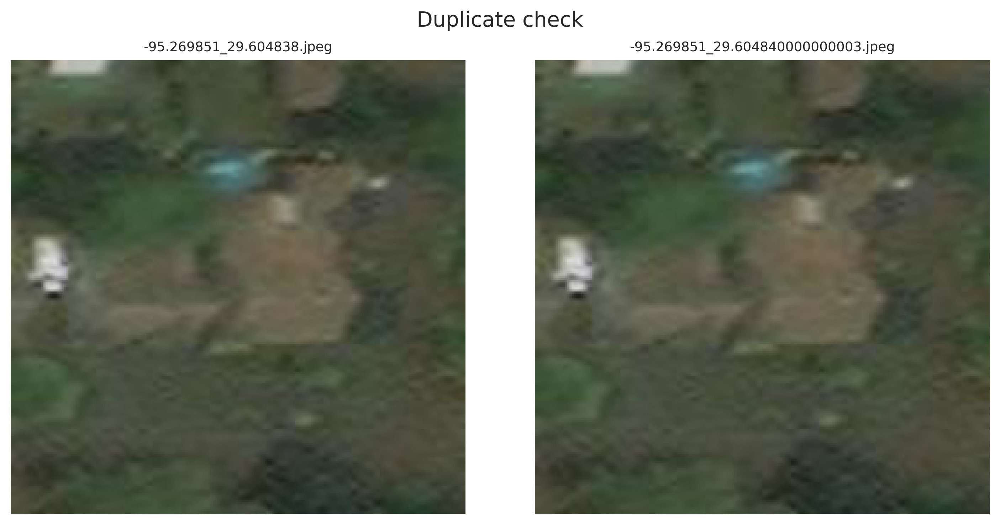

In [92]:
from PIL import Image

import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

img1 = Image.open(f"{DATA_DIR}/train/damage/-95.269851_29.604838.jpeg")
img2 = Image.open(f"{DATA_DIR}/train/damage/-95.269851_29.604840000000003.jpeg")

axes[0].imshow(img1)
axes[0].set_title("-95.269851_29.604838.jpeg", fontsize=9)
axes[0].axis('off')

axes[1].imshow(img2)
axes[1].set_title("-95.269851_29.604840000000003.jpeg", fontsize=9)
axes[1].axis('off')

fig.suptitle('Duplicate check', fontsize=14)
plt.tight_layout()
save_fig(fig, 'duplicate_check')
plt.show()

## 7) Augmentation prototypes

Saved figure to ../eda_plots/eda_resampled_dataset_augmentation_preview.pdf


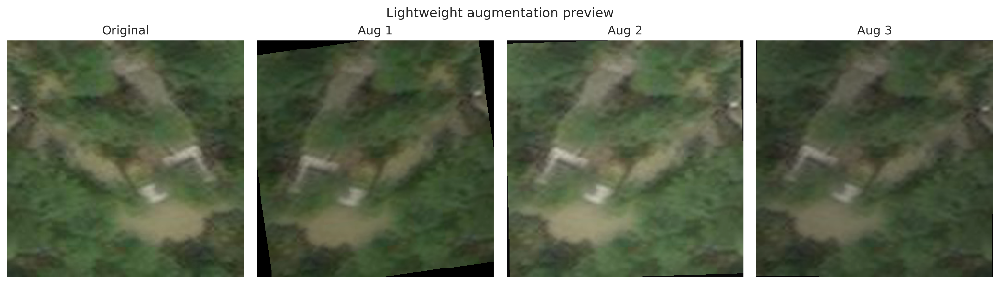

In [93]:
AUG_PARAMS = {'max_rotate_deg': 20, 'hflip_p': 0.5, 'brightness': (0.8, 1.2), 'contrast': (0.85, 1.15), 'saturation': (0.85, 1.15)}

def apply_random_aug(img: Image.Image, params=AUG_PARAMS, seed=None) -> Image.Image:
    rng_local = random.Random(seed)
    out = img
    if rng_local.random() < params['hflip_p']:
        out = ImageOps.mirror(out)
    angle = rng_local.uniform(-params['max_rotate_deg'], params['max_rotate_deg'])
    out = out.rotate(angle, resample=Image.BILINEAR)
    b_min, b_max = params['brightness']; c_min, c_max = params['contrast']; s_min, s_max = params['saturation']
    out = ImageEnhance.Brightness(out).enhance(rng_local.uniform(b_min, b_max))
    out = ImageEnhance.Contrast(out).enhance(rng_local.uniform(c_min, c_max))
    out = ImageEnhance.Color(out).enhance(rng_local.uniform(s_min, s_max))
    return out

sample_path = image_df.iloc[0]['path']
with Image.open(sample_path) as base_img:
    base_img = base_img.convert('RGB')
    fig, axes = plt.subplots(1, 4, figsize=(14, 4))
    axes[0].imshow(base_img)
    axes[0].set_title('Original')
    for i in range(1, 4):
        aug_img = apply_random_aug(base_img, seed=SEED + i)
        axes[i].imshow(aug_img)
        axes[i].set_title(f'Aug {i}')
    for ax in axes:
        ax.axis('off')
    fig.suptitle('Lightweight augmentation preview', fontsize=13)
    plt.tight_layout()
    save_fig(fig, 'augmentation_preview')
    plt.show()
